# Set-up and Data Prep

In [36]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
import seaborn as sns # for visualiation
from sklearn.pipeline import make_pipeline  
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV  
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import Imputer

import altair as alt
alt.renderers.enable('notebook') # enable altair rendering

import warnings
warnings.filterwarnings('ignore')

In [37]:
# Read in data to panda
train = pd.read_csv('Data/train.csv')

# Drop column that we cannot interpret
train_features = train.drop(['dependency'], axis = 1)


In [38]:
# Make data consistent for certain columns by replacing "no" values with 0
train_features['edjefe'] = train_features['edjefe'].replace({'no': 0})
train_features['edjefa'] = train_features['edjefa'].replace({'no': 0})

In [39]:
# Changing target outcome from multilevel into binary

train_features['Target'] = train_features['Target'].replace({1: 1})
train_features['Target'] = train_features['Target'].replace({2: 1})
train_features['Target'] = train_features['Target'].replace({3: 1})
train_features['Target'] = train_features['Target'].replace({4: 0})
train_features.Target.value_counts()

# Create table for outcomes
# Define train_labels
train_labels = {}
train_labels['outcome'] = train_features['Target']


# Filling Missing Data

In [40]:
# See how many missing values are in each column
null_columns=train_features.columns[train_features.isnull().any()]
train_features[null_columns].isnull().sum()

v2a1         6860
v18q1        7342
rez_esc      7928
meaneduc        5
SQBmeaned       5
dtype: int64

In [41]:
# meaneduc - average years of education for adults (18+)
# SQBmeaned - square of the mean years of education of adults (>=18) in the household
# These variables are related and have very few missing values so we can imput 0 

train_features['meaneduc'].fillna(0, inplace=True)
train_features['SQBmeaned'].fillna(0, inplace=True)

In [42]:
# v18q1 - number of tablets household owns
# Highly related v18q which simply tells us if a person owns a table. From first glance it looks like people who don't 
# own a tablet have 'NaN' values in v18q1

# check how many people don't own tablet at all in column v18q
(train_features['v18q'] == 0).sum()

# count is equivalent to number of people who have NaN values in v18q1 which means people who have a 0 in v18q are the ones missing
# data in v18q1 so we can fill in 0

train_features['v18q1'].fillna(0, inplace=True)


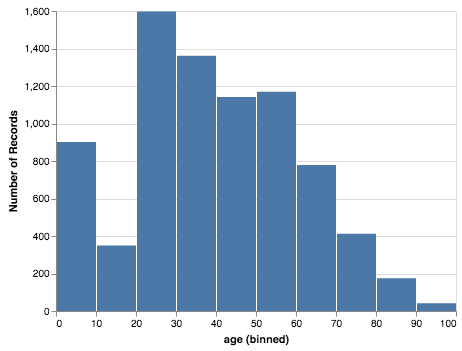

In [43]:
# rez_esc - Years behind in school
# values include NaN, 0, and higher numbers...what's the difference between NaN and 0? 
#df = train_features[train_features.isnull().any(axis=1)]
#df_rez_null = df['age', 'rez_esc']

# create boolean variable to store which rows are null for rez_esc
rez_is_null =  train_features['rez_esc'].isna()

# create new data frame with only rows that are null for rez_esc
null_df = train_features[rez_is_null]

# disable altair max rows
alt.data_transformers.enable('default', max_rows=None)

# plot distribution of ages for these rows
alt.Chart(null_df).mark_bar().encode(
    alt.X("age", bin=True),
    y= 'count()',
)

In [44]:
# Majority of people with NaN values for rez_esc are either children too young for school or adults that have already finished
# school so we can impute 0 for the NaN values
train_features['rez_esc'].fillna(0, inplace=True)

In [45]:
# v2a1 - Monthly rent payment
# People who own houses don't pay rent. We have columns that tell us whether people own houses or not so we can see if
# there is a relationship between type of home ownership and NaN values in rent 


# create boolean variable to store which rows are null for v2a1 rent
rent_is_null = train_features['v2a1'].isna()

# create new data frame with only rows that are null for rez_esc
null_df = train_features[rent_is_null]

In [46]:
print("Owns:", (null_df['tipovivi1'] != 0).sum())
print("Installments:", (null_df['tipovivi2'] != 0).sum())
print("Rents: ", (null_df['tipovivi3'] != 0).sum())
print("Precarious: ", (null_df['tipovivi4'] != 0).sum())
print("Other: ",(null_df['tipovivi5'] != 0).sum())

Owns: 5911
Installments: 0
Rents:  0
Precarious:  163
Other:  786


In [47]:
# Clearly, the majority of the null values are due to people owning their homes and therefore not paying rent. We can 
# impute 0 for all missing values of rent and not skew any data for over 5,000 datapoints
train_features['v2a1'].fillna(0, inplace=True)

In [48]:
# All missing data has been taken care of
null_columns=train_features.columns[train_features.isnull().any()]
train_features[null_columns].isnull().sum()

Series([], dtype: float64)

# Statistical Modeling: Logistic Regression

In [49]:
from sklearn.linear_model import LogisticRegression
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [50]:
# Use the `smf.glm` function to fit `default` to `balance` (hint: use the `binomial` family)
formula = 'Target~v2a1' #--> Feature-Selection
model = smf.glm(formula=formula, data=train_features, family=sm.families.Binomial()).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                 9557
Model:                            GLM   Df Residuals:                     9555
Model Family:                Binomial   Df Model:                            1
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -6103.8
Date:                Sun, 02 Dec 2018   Deviance:                       12208.
Time:                        01:03:25   Pearson chi2:                 9.35e+03
No. Iterations:                     5   Covariance Type:             nonrobust
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.3162      0.023    -13.509      0.000      -0.362      -0.270
v2a1       -5.651e-06   3.34e-07    -16.906      0.000   -6.31e-06      -5e-06
==============================================================================
"""

In [51]:
# Generate a set of predicted probabilities using your model
predict = model.predict()
train_features['predict'] = predict

In [52]:
train_features

,Id,v2a1,hacdor,rooms,hacapo,v14a,refrig,v18q,v18q1,r4h1,...,SQBage,SQBhogar_total,SQBedjefe,SQBhogar_nin,SQBovercrowding,SQBdependency,SQBmeaned,agesq,Target,predict
0,ID_279628684,190000.0,0,3,0,1,1,0,0.0,0,...,1849,1,100,0,1.000000,0.000000,100.000000,1849,0,0.199422
1,ID_f29eb3ddd,135000.0,0,4,0,1,1,1,1.0,0,...,4489,1,144,0,1.000000,64.000000,144.000000,4489,0,0.253677
2,ID_68de51c94,0.0,0,8,0,1,1,0,0.0,0,...,8464,1,0,0,0.250000,64.000000,121.000000,8464,0,0.421608
3,ID_d671db89c,180000.0,0,5,0,1,1,1,1.0,0,...,289,16,121,4,1.777778,1.000000,121.000000,289,0,0.208597
4,ID_d56d6f5f5,180000.0,0,5,0,1,1,1,1.0,0,...,1369,16,121,4,1.777778,1.000000,121.000000,1369,0,0.208597
5,ID_ec05b1a7b,180000.0,0,5,0,1,1,1,1.0,0,...,1444,16,121,4,1.777778,1.000000,121.000000,1444,0,0.208597
6,ID_e9e0c1100,180000.0,0,5,0,1,1,1,1.0,0,...,64,16,121,4,1.777778,1.000000,121.000000,64,0,0.208597
7,ID_3e04e571e,130000.0,1,2,0,1,1,0,0.0,0,...,49,16,81,4,16.000000,1.000000,100.000000,49,0,0.259064
8,ID_1284f8aad,130000.0,1,2,0,1,1,0,0.0,0,...,900,16,81,4,16.000000,1.000000,100.000000,900,0,0.259064
9,ID_51f52fdd2,130000.0,1,2,0,1,1,0,0.0,0,...,784,16,81,4,16.000000,1.000000,100.000000,784,0,0.259064


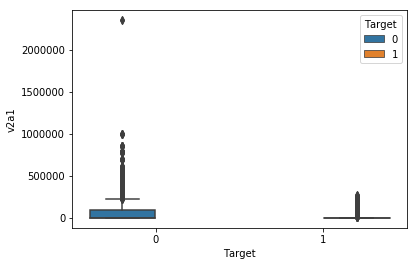

In [56]:
# Visualize the predicted probabilities across)
sns.boxplot(x="Target", y="v2a1", hue = "Target", data=train_features)

In [54]:
# Retrieve beta values from the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                 9557
Model:                            GLM   Df Residuals:                     9555
Model Family:                Binomial   Df Model:                            1
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -6103.8
Date:                Sun, 02 Dec 2018   Deviance:                       12208.
Time:                        01:03:26   Pearson chi2:                 9.35e+03
No. Iterations:                     5   Covariance Type:             nonrobust
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.3162      0.023    -13.509      0.000      -0.362      -0.270
v2a1       -5.651e-06   3.34e-07    -16.906      0.000   -6.31e-06      -5e-06
==============================================================================
"""

# Statistical Modeling: Linear Modeling

In [55]:
formula = 'Target~v2a1' #--> Feature-Selection
linear = smf.ols(formula = formula, data=train_features).fit()
# Then, use the `.summary()` method of your model to print our information about your model
linear.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Target   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     311.2
Date:                Sun, 02 Dec 2018   Prob (F-statistic):           1.42e-68
Time:                        01:03:27   Log-Likelihood:                -6462.5
No. Observations:                9557   AIC:                         1.293e+04
Df Residuals:                    9555   BIC:                         1.294e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.4093      0.005     77.324      0.000       0.399       0.420
v2a1       -7.867e-07   4.46e-08    -17.642      0.000   -8.74e-07   -6.99e-07
==============================================================================
Omnibus:                      322.558   Durbin-Watson:                   0.564
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1505.817
Skew:                           0.473   Prob(JB):                         0.00
Kurtosis:                       1.301   Cond. No.                     1.29e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [57]:
# Generate a set of predicted probabilities using your model
linear_predictions = linear.predict()
train_features['linear_predictions'] = linear_predictions

In [58]:
train_features

,Id,v2a1,hacdor,rooms,hacapo,v14a,refrig,v18q,v18q1,r4h1,...,SQBhogar_total,SQBedjefe,SQBhogar_nin,SQBovercrowding,SQBdependency,SQBmeaned,agesq,Target,predict,linear_predictions
0,ID_279628684,190000.0,0,3,0,1,1,0,0.0,0,...,1,100,0,1.000000,0.000000,100.000000,1849,0,0.199422,0.259819
1,ID_f29eb3ddd,135000.0,0,4,0,1,1,1,1.0,0,...,1,144,0,1.000000,64.000000,144.000000,4489,0,0.253677,0.303087
2,ID_68de51c94,0.0,0,8,0,1,1,0,0.0,0,...,1,0,0,0.250000,64.000000,121.000000,8464,0,0.421608,0.409288
3,ID_d671db89c,180000.0,0,5,0,1,1,1,1.0,0,...,16,121,4,1.777778,1.000000,121.000000,289,0,0.208597,0.267686
4,ID_d56d6f5f5,180000.0,0,5,0,1,1,1,1.0,0,...,16,121,4,1.777778,1.000000,121.000000,1369,0,0.208597,0.267686
5,ID_ec05b1a7b,180000.0,0,5,0,1,1,1,1.0,0,...,16,121,4,1.777778,1.000000,121.000000,1444,0,0.208597,0.267686
6,ID_e9e0c1100,180000.0,0,5,0,1,1,1,1.0,0,...,16,121,4,1.777778,1.000000,121.000000,64,0,0.208597,0.267686
7,ID_3e04e571e,130000.0,1,2,0,1,1,0,0.0,0,...,16,81,4,16.000000,1.000000,100.000000,49,0,0.259064,0.307020
8,ID_1284f8aad,130000.0,1,2,0,1,1,0,0.0,0,...,16,81,4,16.000000,1.000000,100.000000,900,0,0.259064,0.307020
9,ID_51f52fdd2,130000.0,1,2,0,1,1,0,0.0,0,...,16,81,4,16.000000,1.000000,100.000000,784,0,0.259064,0.307020
